<a href="https://colab.research.google.com/github/Saurav-Raghaw/Optimization/blob/main/Research_1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

##Univariate Linear Regression without Gradient Descent, with GD, SGD and Mini-Batch SGD


#Dataset Description
Bike Sharing Dataset: Bike-sharing rental process is highly correlated to the environmental and seasonal settings. For instance, weather conditions,
precipitation, day of week, season, hour of the day, etc. can affect the rental behaviors.

#Linear Regression
Associated tasks: Regression- Predication of bike rental count hourly or daily based on the environmental and seasonal settings.

#Importing Libraries

In [96]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error

import operator 
import math

#Loading The Dataset

In [97]:
df = pd.read_csv('/content/hour.csv')
df.head()

,instant,dteday,season,yr,mnth,hr,holiday,weekday,workingday,weathersit,temp,atemp,hum,windspeed,casual,registered,cnt
0,1,2011-01-01,1,0,1,0,0,6,0,1,0.24,0.2879,0.81,0.0,3,13,16
1,2,2011-01-01,1,0,1,1,0,6,0,1,0.22,0.2727,0.80,0.0,8,32,40
2,3,2011-01-01,1,0,1,2,0,6,0,1,0.22,0.2727,0.80,0.0,5,27,32
3,4,2011-01-01,1,0,1,3,0,6,0,1,0.24,0.2879,0.75,0.0,3,10,13
4,5,2011-01-01,1,0,1,4,0,6,0,1,0.24,0.2879,0.75,0.0,0,1,1


#Preprocessing: Removing Outliers and Scaling

In [98]:
df[['temp', 'cnt']].describe()[1:]

,temp,cnt
mean,0.496987,189.463088
std,0.192556,181.387599
min,0.020000,1.000000
25%,0.340000,40.000000
50%,0.500000,142.000000
75%,0.660000,281.000000
max,1.000000,977.000000


It seems that cnt has some outliers, because 75% of the data has cnt less than 281, but maximum price go as high as 977. We're going to remove extremely large cnt as they will add unnecessary noize to the data.

In [99]:
df_new = df[df.cnt < 500]
df_new.head()

,instant,dteday,season,yr,mnth,hr,holiday,weekday,workingday,weathersit,temp,atemp,hum,windspeed,casual,registered,cnt
0,1,2011-01-01,1,0,1,0,0,6,0,1,0.24,0.2879,0.81,0.0,3,13,16
1,2,2011-01-01,1,0,1,1,0,6,0,1,0.22,0.2727,0.80,0.0,8,32,40
2,3,2011-01-01,1,0,1,2,0,6,0,1,0.22,0.2727,0.80,0.0,5,27,32
3,4,2011-01-01,1,0,1,3,0,6,0,1,0.24,0.2879,0.75,0.0,3,10,13
4,5,2011-01-01,1,0,1,4,0,6,0,1,0.24,0.2879,0.75,0.0,0,1,1


In [100]:
df_new[['temp', 'cnt']].describe()[1:]

,temp,cnt
mean,0.486306,153.803132
std,0.191804,131.937553
min,0.020000,1.000000
25%,0.320000,34.000000
50%,0.480000,125.000000
75%,0.640000,240.000000
max,1.000000,499.000000


Now Outlires have been removed.

#Scale the cnt column within range [0-1]

In [101]:
def scale(x):
    min = x.min()
    max = x.max()
    return pd.Series([(i - min)/(max - min) for i in x])

#Input and Output
Here i have taken y = cnt and x = temp. Based on the temp i will predict the cnt.

In [102]:
x = df_new['temp']
x.head()


0    0.24
1    0.22
2    0.22
3    0.24
4    0.24
Name: temp, dtype: float64

In [103]:
y = scale(df_new.cnt)
y.head()

0    0.030120
1    0.078313
2    0.062249
3    0.024096
4    0.000000
dtype: float64

In [104]:
x.max(), y.max() #good.

(1.0, 1.0)

#Relationship Between temp and cnt
Visually we can determine what kind of accuracy we can expect from the models

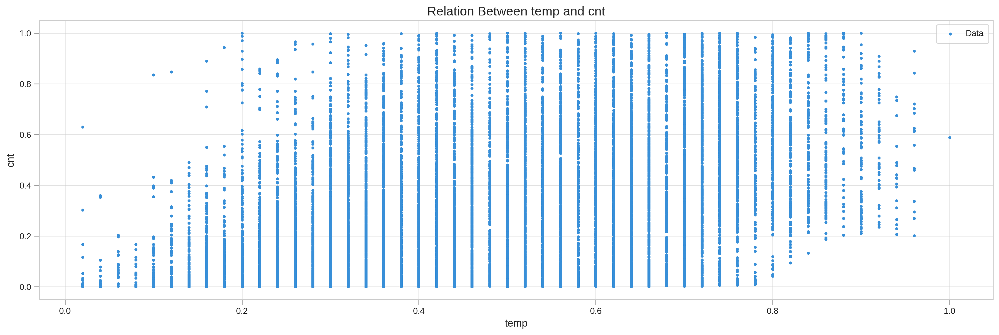

In [105]:
plt.figure(figsize=(20,6))
plt.rcParams['figure.dpi'] = 227
plt.style.use('seaborn-whitegrid')
plt.scatter(x, y, label='Data', c='#388fd8', s=6)
plt.title('Relation Between temp and cnt', fontSize=15)
plt.xlabel('temp', fontSize=12)
plt.ylabel('cnt', fontSize=12)
plt.legend(frameon=True, loc=1, fontsize=10, borderpad=.6)
plt.tick_params(direction='out', length=6, color='#a0a0a0', width=1, grid_alpha=.6)
plt.show()

#Univariate Linear Regression (Without Gradient Descent)
$$\hat{y} = mx + b$$


$$m = \frac{\overline{x}\overline{y}-\overline{xy}}{(\overline{x})^2 - \overline{x^2}} \quad \textrm{and} \quad b = \overline{y}-m\overline{x}$$

If we want to add some other features, like humidity, our formula would look like this: $\hat{y} = m_1x_1 + m_2x_2 + b$, where $m_1$ and $m_2$ are slopes for each feature $x_1$ and $x_2$. In this case we would call it multiple linear regression, but we could no longer use formulas above.


In [106]:
class UnivariateLinearRegression:
        
    def fit(self, X, y):
        self.X = X
        self.y = y
        self.m = ((np.mean(X) * np.mean(y) - np.mean(X*y)) / ((np.mean(X)**2) - np.mean(X**2)))
        self.b = np.mean(y) - self.m * np.mean(X)
    
    def coeffs(self):
        return self.m, self.b
    
    def predict(self):
        self.y_pred = self.m * self.X + self.b
        return self.y_pred
    
    def r_squared(self):
        self.y_mean = np.full((len(self.y)), mean(self.y))
        err_reg = sum((self.y - self.y_pred)**2)
        err_y_mean = sum((self.y - self.y_mean)**2)
        return (1 - (err_reg/err_y_mean))

In [107]:
def plot_regression(X, y, y_pred, log=None, title="Linear Regression"):
    
    plt.figure(figsize=(20,6))
    plt.rcParams['figure.dpi'] = 227
    plt.scatter(X, y, label='Data', c='#388fd8', s=6)
    if log != None:
        for i in range(len(log)):
            plt.plot(X, log[i][0]*X + log[i][1], lw=1, c='#caa727', alpha=0.35)
    plt.plot(X, y_pred, c='#ff7702', lw=3, label='Regression')
    plt.title(title, fontSize=14)
    plt.xlabel('temp', fontSize=11)
    plt.ylabel('cnt', fontSize=11)
    plt.legend(frameon=True, loc=1, fontsize=10, borderpad=.6)
    plt.tick_params(direction='out', length=6, color='#a0a0a0', width=1, grid_alpha=.6)
    plt.show()

In [108]:
lr = UnivariateLinearRegression()

In [109]:
lr.fit(x, y)

In [110]:
y_pred = lr.predict()

MSE: 0.06036862963818121


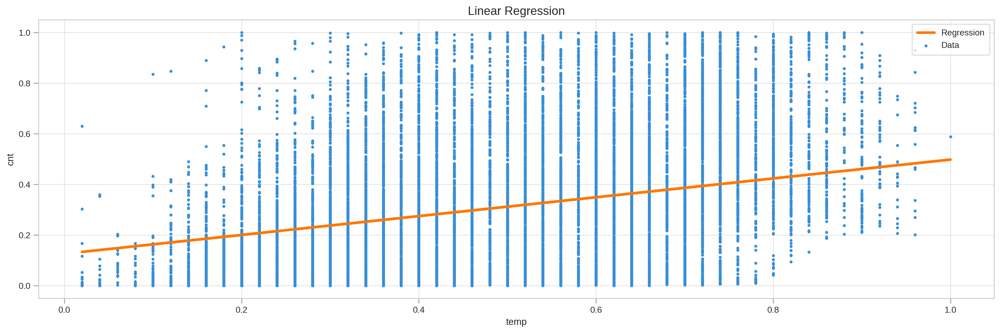

In [111]:
print("MSE:",mean_squared_error(y, y_pred))
plot_regression(x, y, y_pred, title="Linear Regression")

#Gradient Descent
$$ MSE = \frac{1}{n}\sum_{i=1}^{n} (y_i - \hat{y_i})^2 \quad \textrm{where} \quad \hat{y_i} = mx_i + b $$
$$𝑓(𝑚,𝑏)= \frac{1}{n}\sum_{i=1}^{n}(y_i - (mx_i+b))^2$$
$$\frac{\partial f}{\partial m} = \frac{1}{n}\sum_{i=1}^{n}-2x_i(y_i - (mx_i+b))$$
$$\frac{\partial f}{\partial b} = \frac{1}{n}\sum_{i=1}^{n}-2(y_i - (mx_i+b))$$


    
    
    

*   Gradient descent is an iterative process and with each iteration (epoch) we slightly minimizing MSE, so each time we use our derived functions to update parameters m and b
*   Because its iterative, we should choose how many iterations we take, or make algorithm stop when we approach minima of MSE. In other words when algorithm is no longer improving MSE, we know it reached minimum.
* Gradient descent has an additional parameter learning rate (lr), which helps control how fast or slow algorithm going towards minima of MSE


Thats about it. So you can already understand that Gradient Descent for the most part is just process of taking derivatives and using them over and over to minimize function.

In [178]:
def gradient_descent(X, y, lr=0.05, epoch=10):
    
    m, b = 0.5, 0.5 # parameters
    log, mse = [], [] # lists to store learning process
    N = len(X) # number of samples
    
    for _ in range(epoch):
                
        f = y - (m*X + b)
    
        # Updating m and b
        m -= lr * (-2 * (X*f).sum() / N)
        b -= lr * (-2 * f.sum() / N)
        
        log.append((m, b))
        mse.append(mean_squared_error(y, (m*X + b)))        
    
    return m, b, log, mse

In [179]:
m, b, log, mse = gradient_descent(x, y, lr=0.01, epoch=1000)

MSE: 0.06107050714127002


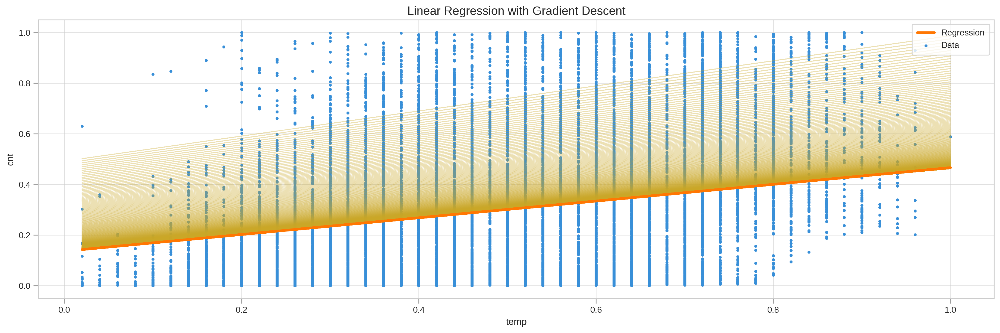

CPU times: user 5.29 s, sys: 152 ms, total: 5.44 s
Wall time: 5.46 s


In [180]:
%%time
y_pred = m*x + b
print("MSE:",mean_squared_error(y, y_pred))
plot_regression(x, y, y_pred, log=log, title="Linear Regression with Gradient Descent")


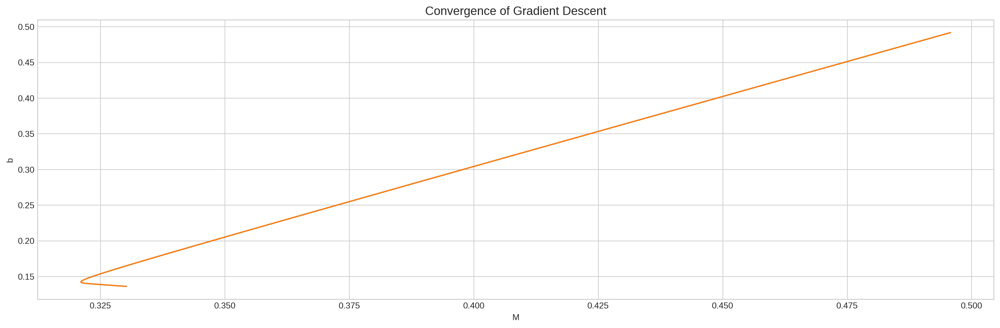

CPU times: user 806 ms, sys: 5.92 ms, total: 812 ms
Wall time: 815 ms


In [181]:
%%time
x_val = [l[0] for l in log]
y_val = [l[1] for l in log]

plt.figure(figsize=(20,6))
plt.rcParams['figure.dpi'] = 227

plt.title('Convergence of Gradient Descent', fontSize=14)
plt.xlabel('M')
plt.ylabel('b')

plt.plot(x_val,y_val)
plt.plot(x_val,y_val)

plt.show()

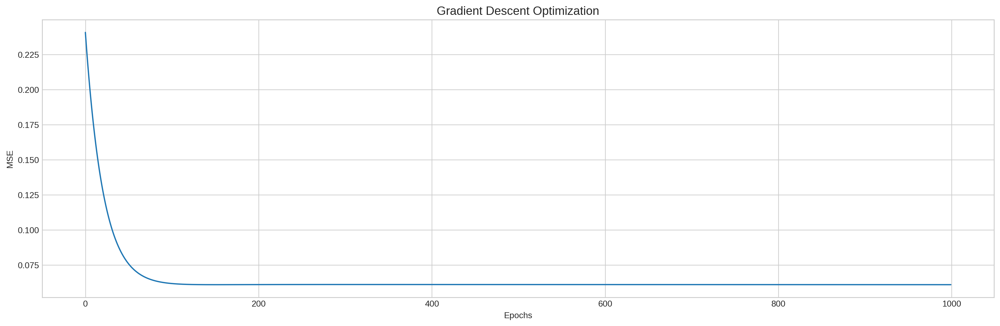

CPU times: user 787 ms, sys: 45.7 ms, total: 833 ms
Wall time: 836 ms


In [182]:
%%time
plt.figure(figsize=(20,6))
plt.rcParams['figure.dpi'] = 227
plt.plot(range(len(mse)), mse)
plt.title('Gradient Descent Optimization', fontSize=14)
plt.xlabel('Epochs')
plt.ylabel('MSE')
plt.show()

#Notes:
In machine learning, accuracy is defined for discrete values (classes). Its defined as the fraction of correct predictions from total predictions made.

So, a prediction of value 319 where true value is 320 is still an incorrect prediction.

So its not advised to calculate accuracy for continuous values. For such values you would want to calculate a measure of how close the predicted values are to the true values. This task of prediction of continuous values is known as regression. And generally R-squared value is used to measure the performance of the model.

You can use r2_score(y_true, y_pred) for your scenario.

There are various metrics for regression tasks (continuous variables prediction) like:-

Mean squared error,
Mean absolute error,
Variance score, etc

#SGD: Stochastic Gradient Descent(or Batch Gradient Descent)


1.   Here, within for loop we take only one instance and update the value of m and b.
2. SGD is twice as fast as Gradient Descent.
3. At last we again compare the speed of GD and SGD.



In [183]:
def SGD(X, y, lr=0.05, epoch=10, batch_size=1): # if batch_size is more than 1 then it become mini-batch SGD

    
    m, b = 0.5, 0.5 # initial parameters
    log, mse = [], [] # lists to store learning process
    
    for _ in range(epoch):
        
        indexes = np.random.randint(0, len(X), batch_size) # random sample
        
        Xs = np.take(X, indexes)
        ys = np.take(y, indexes)
        N = len(Xs)
        
        f = ys - (m*Xs + b)
        
        # Updating parameters m and b
        m -= lr * (-2 * (Xs*f).sum() / N)
        b -= lr * (-2 * f.sum() / N)
        
        log.append((m, b))
        mse.append(mean_squared_error(y, m*X+b))        
    
    return m, b, log, mse

In [184]:
m, b, log, mse = SGD(x, y, lr=0.01, epoch=1000, batch_size=1)

MSE: 0.06754019107011697


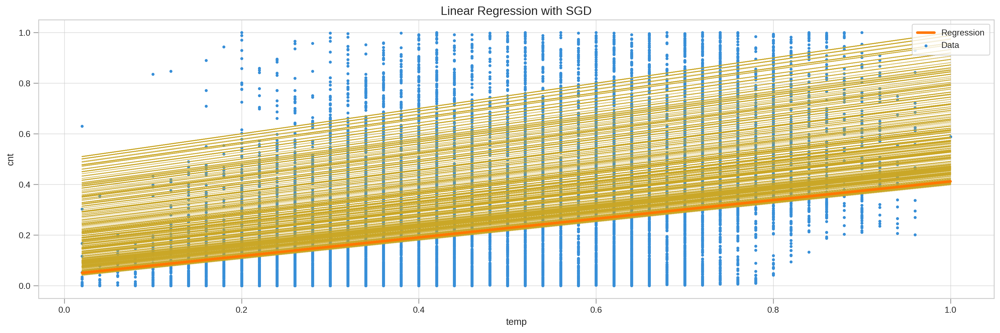

CPU times: user 5.14 s, sys: 108 ms, total: 5.24 s
Wall time: 5.27 s


In [185]:
%%time
y_pred = m*x + b
print("MSE:",mean_squared_error(y, y_pred))
plot_regression(x, y, y_pred, log=log, title="Linear Regression with SGD")

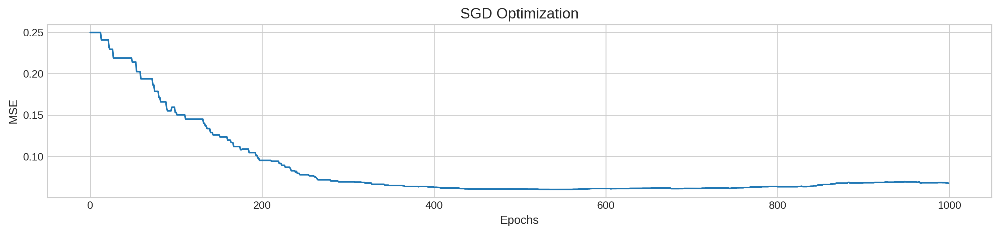

CPU times: user 381 ms, sys: 1.78 ms, total: 383 ms
Wall time: 384 ms


In [187]:
%%time
plt.figure(figsize=(16,3))
plt.rcParams['figure.dpi'] = 227
plt.plot(range(len(mse)), mse)
plt.title('SGD Optimization', fontSize=14)
plt.xlabel('Epochs', fontSize=11)
plt.ylabel('MSE', fontSize=11)
plt.show()

#Convergence of Batch Dradient(SGD)

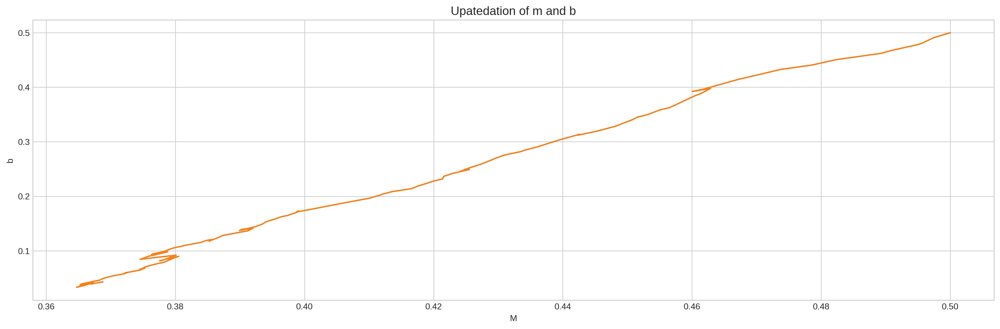

CPU times: user 788 ms, sys: 2.58 ms, total: 790 ms
Wall time: 793 ms


In [188]:
%%time
x_val = [l[0] for l in log]
y_val = [l[1] for l in log]

plt.figure(figsize=(20,6))
plt.rcParams['figure.dpi'] = 227

plt.title('Upatedation of m and b', fontSize=14)
plt.xlabel('M')
plt.ylabel('b')

plt.plot(x_val,y_val)
plt.plot(x_val,y_val)

plt.show()

In [127]:
m,b

(0.3586534593261146, 0.04631277591308014)

#Mini-Batch SGD
We are taking Batch size greater than 1.

In [189]:
def mini_batch_SGD(X, y, lr=0.05, epoch=10, batch_size=1): 
    
    m, b = 0.5, 0.5 # initial parameters
    log, mse = [], [] # lists to store learning process
    
    for _ in range(epoch):
        
        indexes = np.random.randint(0, len(X), batch_size) # random sample
        
        Xs = np.take(X, indexes)
        ys = np.take(y, indexes)
        N = len(Xs)
        
        f = ys - (m*Xs + b)
        
        # Updating parameters m and b
        m -= lr * (-2 * (Xs*f).sum() / N)
        b -= lr * (-2 * f.sum() / N)
        
        log.append((m, b))
        mse.append(mean_squared_error(y, m*X+b))        
    
    return m, b, log, mse

In [197]:
m, b, log, mse = mini_batch_SGD(x, y, lr=0.01, epoch=1000, batch_size=100)

MSE: 0.06445962069321551


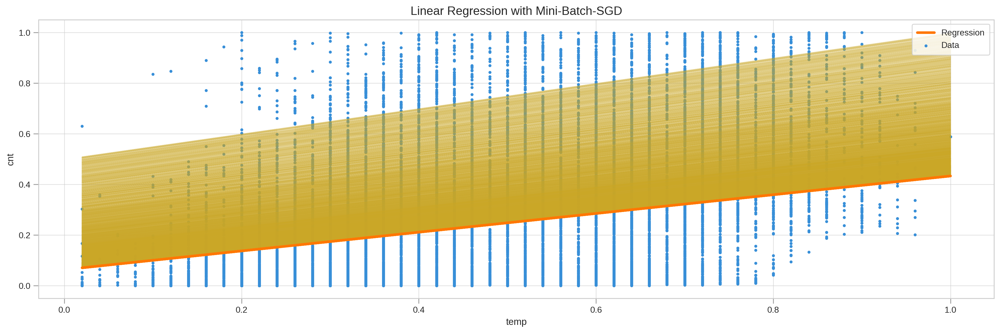

CPU times: user 5.78 s, sys: 139 ms, total: 5.91 s
Wall time: 5.94 s


In [198]:
%%time
y_pred = m*x + b
print("MSE:",mean_squared_error(y, y_pred))
plot_regression(x, y, y_pred, log=log, title="Linear Regression with Mini-Batch-SGD")

#Convergence of Mini_SGD

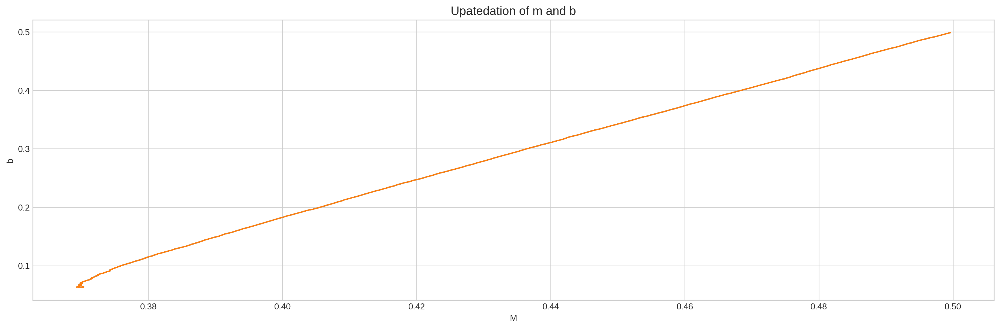

CPU times: user 787 ms, sys: 1.16 ms, total: 788 ms
Wall time: 791 ms


In [199]:
%%time
x_val = [l[0] for l in log]
y_val = [l[1] for l in log]

plt.figure(figsize=(20,6))
plt.rcParams['figure.dpi'] = 227

plt.title('Upatedation of m and b', fontSize=14)
plt.xlabel('M')
plt.ylabel('b')

plt.plot(x_val,y_val)
plt.plot(x_val,y_val)

plt.show()

In [132]:
m,b

(0.3771892128653256, 0.07147664056344225)

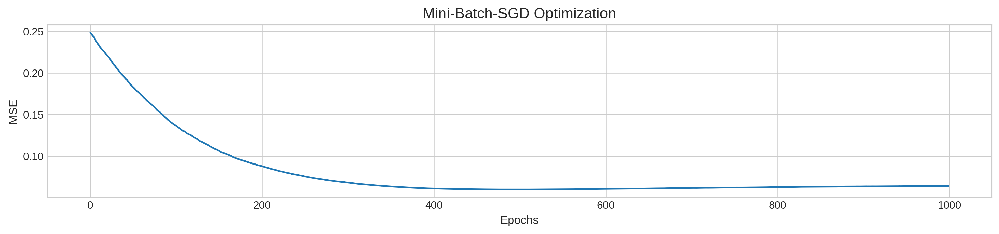

CPU times: user 386 ms, sys: 4.91 ms, total: 391 ms
Wall time: 387 ms


In [200]:
%%time
plt.figure(figsize=(16,3))
plt.rcParams['figure.dpi'] = 227
plt.plot(range(len(mse)), mse)
plt.title('Mini-Batch-SGD Optimization', fontSize=14)
plt.xlabel('Epochs', fontSize=11)
plt.ylabel('MSE', fontSize=11)
plt.show()

#Speed test between GD and SGD (or Batch) and mini-batch SGD

In [134]:
%timeit gradient_descent(X1, y1, lr=0.01, epoch=1000)

1 loop, best of 3: 2.34 s per loop


In [135]:
%timeit SGD(X1, y1, lr=0.01, epoch=1000, batch_size=1)

1 loop, best of 3: 1.39 s per loop


In [136]:
%timeit mini_batch_SGD(X1, y1, lr=0.01, epoch=1000, batch_size=10)

1 loop, best of 3: 1.4 s per loop


#SGD with momentum


1.   If i am repeatedly being asked to move in the same direction then i should probably gain some confidence and start taking bigger steps in that direction. 
2.   just a ball gains momentum while rolling down a slope.



In [201]:
def SGD_momentum(X, y, lr=0.05, epoch=10, mome_para = 0.9):
    
    m, b = 0.5, 0.5 # parameters
    log, mse = [], [] # lists to store learning process
    N = len(X) # number of samples
    prev_update_b = 0
    prev_update_m = 0
    
    for _ in range(epoch):
                
        f = y - (m*X + b)
    
        # Updating m and b
        vm = mome_para*prev_update_m + lr * (-2 * (X*f).sum() / N)
        vb = mome_para*prev_update_b + lr * (-2 * f.sum() / N)

        m = m -vm
        b = b - vb

        prev_update_m = vm
        prev_update_b = vb
        
        log.append((m, b))
        mse.append(mean_squared_error(y, (m*X + b)))        
    
    return m, b, log, mse

In [202]:
m, b, log, mse = SGD_momentum(x, y, lr=0.01, epoch=1000, mome_para= 0.9)

#Convergence of SGD-Momentum

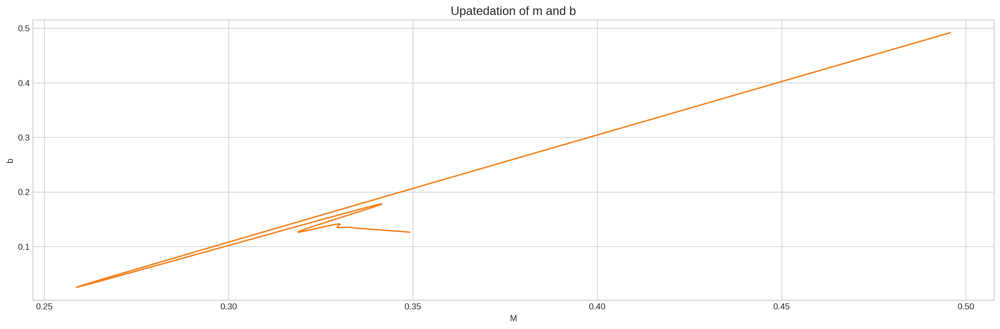

CPU times: user 789 ms, sys: 49 µs, total: 789 ms
Wall time: 795 ms


In [203]:
%%time
x_val = [l[0] for l in log]
y_val = [l[1] for l in log]

plt.figure(figsize=(20,6))
plt.rcParams['figure.dpi'] = 227

plt.title('Upatedation of m and b', fontSize=14)
plt.xlabel('M')
plt.ylabel('b')

plt.plot(x_val,y_val)
plt.plot(x_val,y_val)

plt.show()

In [140]:
m,b

(0.3491292067050617, 0.12624466381856383)

MSE: 0.06079648850679838


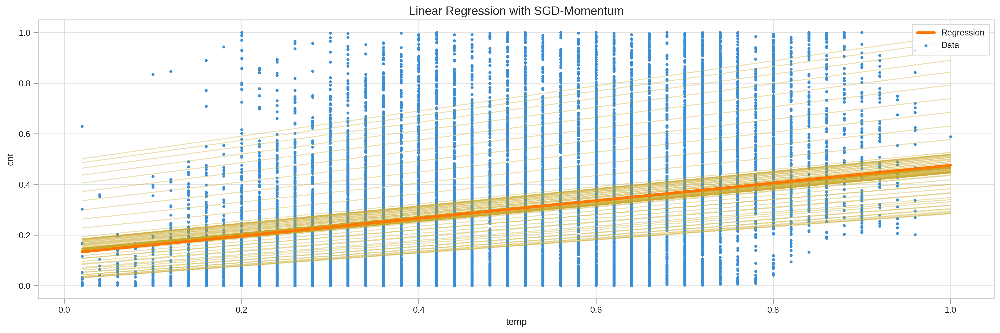

CPU times: user 5.18 s, sys: 160 ms, total: 5.34 s
Wall time: 5.37 s


In [204]:
%%time
y_pred = m*x + b
print("MSE:",mean_squared_error(y, y_pred))
plot_regression(x, y, y_pred, log=log, title="Linear Regression with SGD-Momentum")

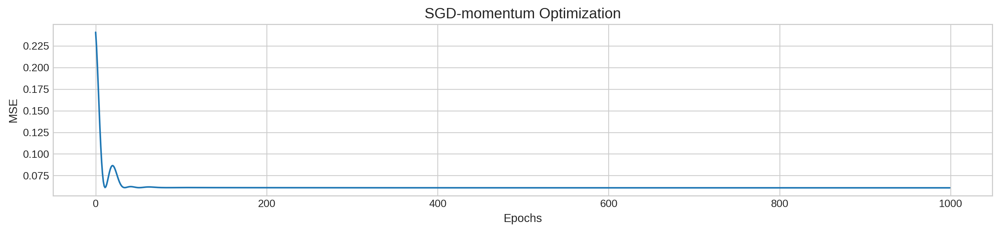

CPU times: user 413 ms, sys: 6.99 ms, total: 420 ms
Wall time: 420 ms


In [205]:
%%time
plt.figure(figsize=(16,3))
plt.rcParams['figure.dpi'] = 227
plt.plot(range(len(mse)), mse)
plt.title('SGD-momentum Optimization', fontSize=14)
plt.xlabel('Epochs', fontSize=11)
plt.ylabel('MSE', fontSize=11)
plt.show()

#Speed test for SGD_momentum

In [143]:
%timeit SGD_momentum(X1, y1, lr=0.01, epoch=1000, mome_para= 0.9)

1 loop, best of 3: 2.34 s per loop


#Adagrad

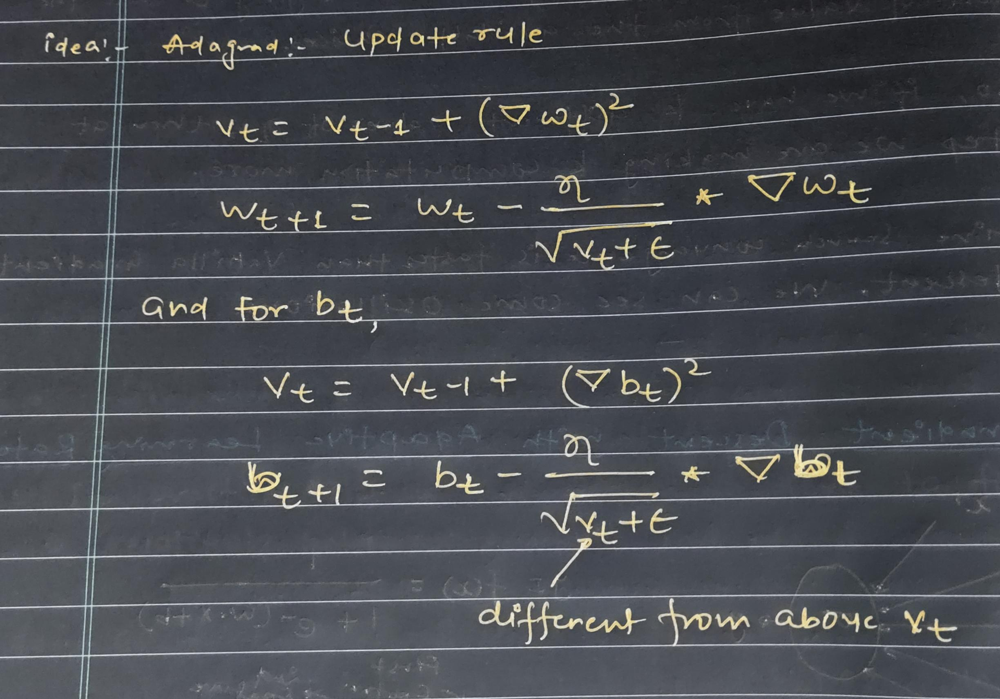

In [206]:
def Adagrad(X, y, lr=0.05, epoch=10):
    
    m, b = 0.5, 0.5 # parameters
    log, mse = [], [] # lists to store learning process
    N = len(X) # number of samples
 
    vm,vb =0,0

    eps = 1e-8

    for i in range(epoch):
      dm, db =0,0

      f = y - (m*X + b)
      dm += lr * (-2 * (X*f).sum() / N)
      db +=  lr * (-2 * f.sum() / N)

     
      vm = vm + dm**2
      vb = vb + db**2

      #m = m - (lr/(vm + eps)) * dm
      #b = b - (lr/(vb + eps)) * db

      m = m - (lr/np.sqrt(vm + eps)) * dm
      b = b - (lr/np.sqrt(vb + eps)) * db

      log.append((m, b))
      mse.append(mean_squared_error(y, (m*X + b)))   

    return m, b, log, mse

In [207]:
m, b, log, mse = Adagrad(x, y, lr=0.01, epoch=1000)

MSE: 0.06316346713198472


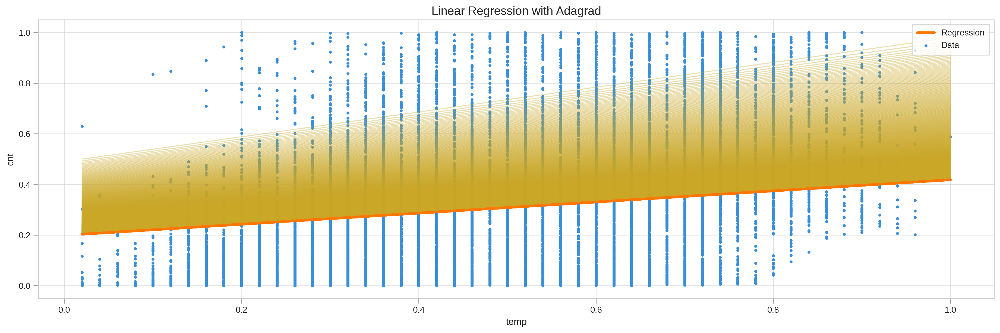

CPU times: user 5.44 s, sys: 148 ms, total: 5.59 s
Wall time: 5.62 s


In [208]:
%%time
y_pred = m*x + b
print("MSE:",mean_squared_error(y, y_pred))
plot_regression(x, y, y_pred, log=log, title="Linear Regression with Adagrad")


#Convergence of Adagrad



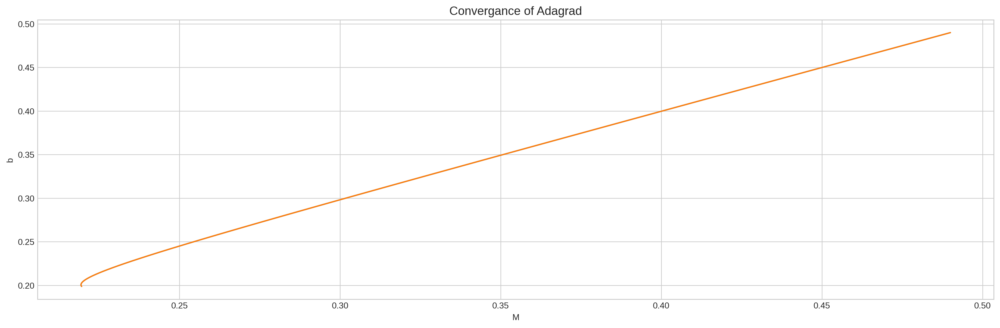

CPU times: user 798 ms, sys: 1.48 ms, total: 800 ms
Wall time: 804 ms


In [209]:
%%time
x_val = [l[0] for l in log]
y_val = [l[1] for l in log]

plt.figure(figsize=(20,6))
plt.rcParams['figure.dpi'] = 227

plt.title('Convergance of Adagrad', fontSize=14)
plt.xlabel('M')
plt.ylabel('b')

plt.plot(x_val,y_val)
plt.plot(x_val,y_val)

plt.show()

In [148]:
m,b

(0.2195390076010775, 0.19875669469546223)

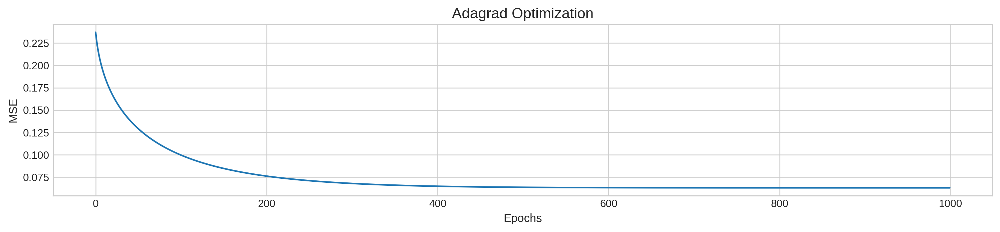

CPU times: user 386 ms, sys: 6.79 ms, total: 393 ms
Wall time: 394 ms


In [210]:
%%time
plt.figure(figsize=(16,3))
plt.rcParams['figure.dpi'] = 227
plt.plot(range(len(mse)), mse)
plt.title('Adagrad Optimization', fontSize=14)
plt.xlabel('Epochs', fontSize=11)
plt.ylabel('MSE', fontSize=11)
plt.show()

#RMSProp :Update Rule:

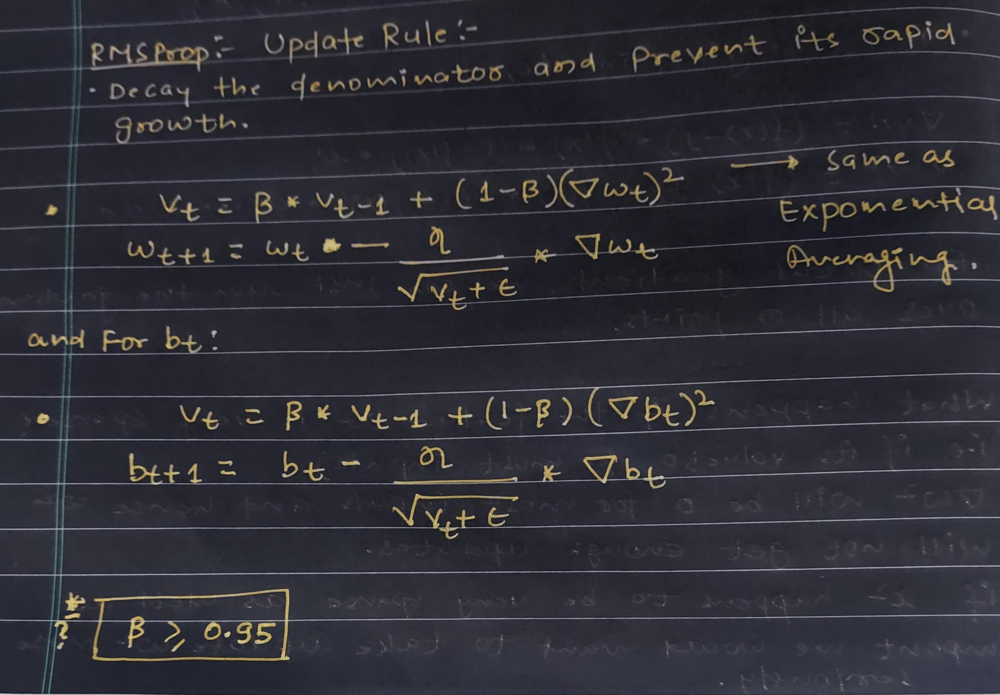

In [211]:
def Adagrad(X, y, lr=0.05, epoch=10):
    
    m, b = 0.5, 0.5 # parameters
    log, mse = [], [] # lists to store learning process
    N = len(X) # number of samples
 
    vm,vb =0,0

    eps = 1e-8
    beta = 0.9

    for i in range(epoch):
      dm, db =0,0

      f = y - (m*X + b)
      dm += lr * (-2 * (X*f).sum() / N)
      db +=  lr * (-2 * f.sum() / N)
     
      vm = beta * vm + (1 - beta) * (dm**2)
      vb = beta * vb + (1 - beta) * (db**2)

      #m = m - (lr/(vm + eps)) * dm
      #b = b - (lr/(vb + eps)) * db

      m = m - (lr/np.sqrt(vm + eps)) * dm
      b = b - (lr/np.sqrt(vb + eps)) * db

      log.append((m, b))
      mse.append(mean_squared_error(y, (m*X + b)))   

    return m, b, log, mse

In [212]:
m, b, log, mse = Adagrad(x, y, lr=0.01, epoch=1000)

MSE: 0.060906727515694634


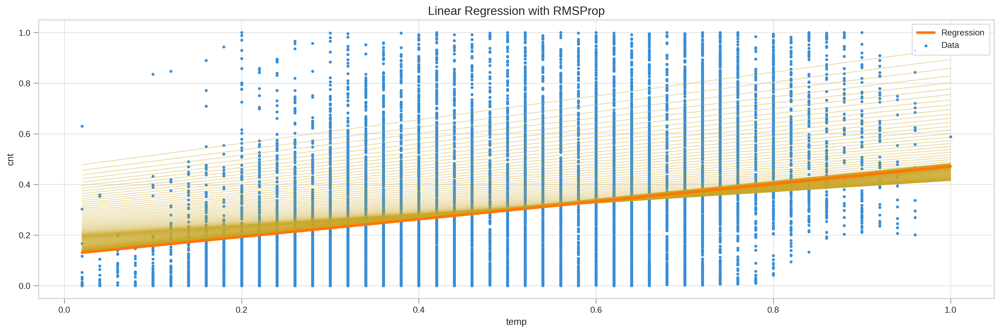

CPU times: user 5.17 s, sys: 154 ms, total: 5.32 s
Wall time: 5.33 s


In [213]:
%%time
y_pred = m*x + b
print("MSE:",mean_squared_error(y, y_pred))
plot_regression(x, y, y_pred, log=log, title="Linear Regression with RMSProp")

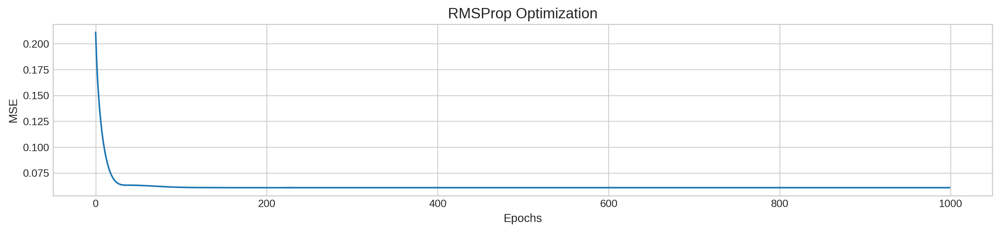

CPU times: user 408 ms, sys: 4.69 ms, total: 412 ms
Wall time: 422 ms


In [214]:
%%time
plt.figure(figsize=(16,3))
plt.rcParams['figure.dpi'] = 227
plt.plot(range(len(mse)), mse)
plt.title('RMSProp Optimization', fontSize=14)
plt.xlabel('Epochs', fontSize=11)
plt.ylabel('MSE', fontSize=11)
plt.show()

#Covergence Of RMSProp

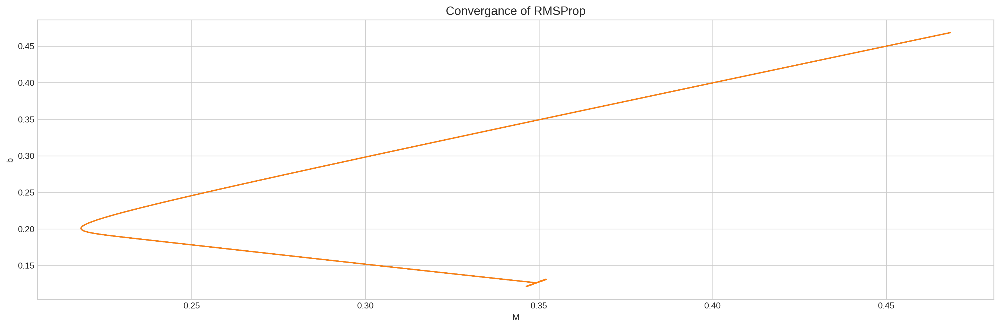

CPU times: user 894 ms, sys: 53.1 ms, total: 947 ms
Wall time: 950 ms


In [215]:
%%time
x_val = [l[0] for l in log]
y_val = [l[1] for l in log]

plt.figure(figsize=(20,6))
plt.rcParams['figure.dpi'] = 227

plt.title('Convergance of RMSProp', fontSize=14)
plt.xlabel('M')
plt.ylabel('b')

plt.plot(x_val,y_val)
plt.plot(x_val,y_val)

plt.show()

In [155]:
m,b

(0.3476343632535802, 0.12344486338153436)

#Adam: Adaptive Moments
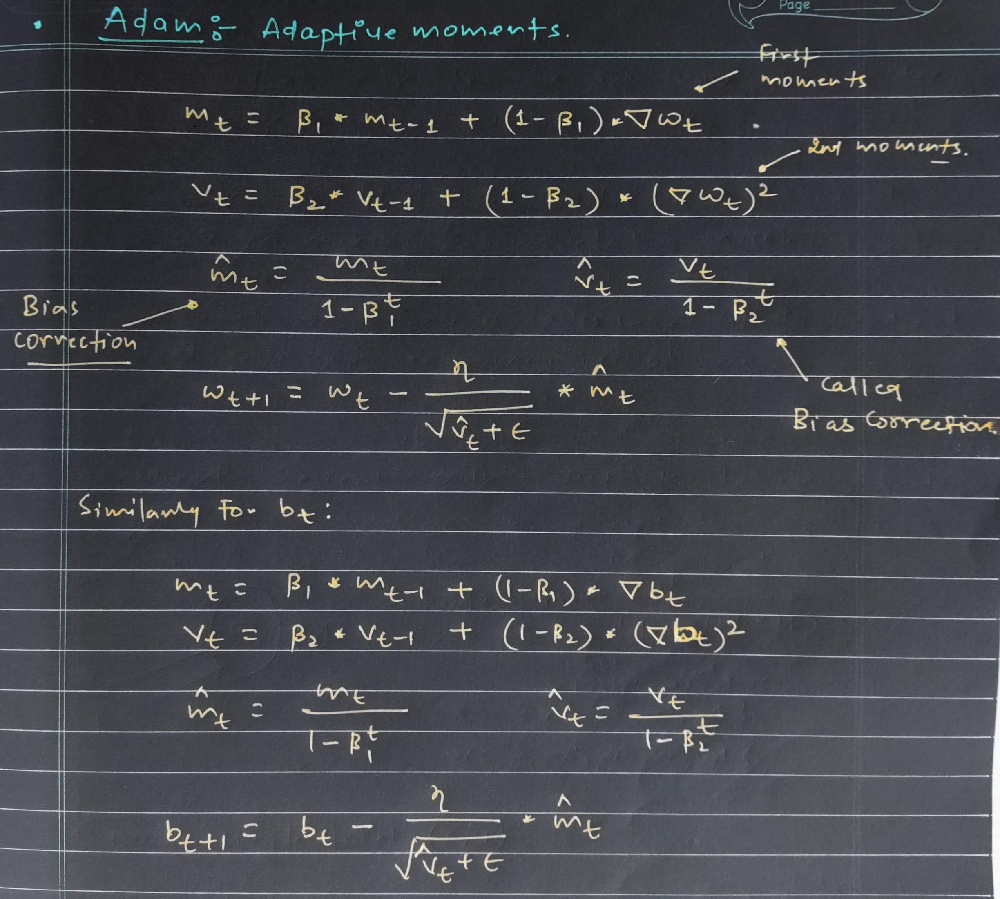

In [216]:
def Adam(X, y, lr=0.05, epoch=10):
    
    m, b = 0.5, 0.5 # parameters
    log, mse = [], [] # lists to store learning process
    N = len(X) # number of samples
 
    vm,vb =0,0

    eps = 1e-8
    beta1, beta2 = 0.9, 0.999
    mmt,mvt,bmt, bvt=0,0,0,0
    mmt_hat, mvt_hat, bmt_hat, bvt_hat = 0,0,0,0

    for i in range(epoch):
      dm, db =0,0

      f = y - (m*X + b)
      dm += lr * (-2 * (X*f).sum() / N)
      db +=  lr * (-2 * f.sum() / N)

      mmt = beta1*mmt + (1 - beta1) * dm
      mvt = beta2*mvt + (1 - beta2) * (dm**2)

      bmt = beta1*bmt + (1 - beta1) * db
      bvt = beta2*bvt + (1 - beta2) * (db**2)

      mmt_hat = mmt/(1- beta1**(i+1))
      mvt_hat = mvt/(1- beta2**(i+1))

      bmt_hat = bmt/(1- beta1**(i+1))
      bvt_hat = bvt/(1-beta2**(i+1))

      m = m - (lr*mmt_hat)/(np.sqrt(mvt_hat + eps))
      b = b - (lr*bmt_hat)/(np.sqrt(bvt_hat + eps))

      log.append((m, b))
      mse.append(mean_squared_error(y, (m*X + b)))   

    return m, b, log, mse

In [217]:
m, b, log, mse = Adam(x,y, lr=0.01, epoch=1000)

In [158]:
m,b

(0.349211260081598, 0.12620272316371073)

MSE: 0.060795352409128776


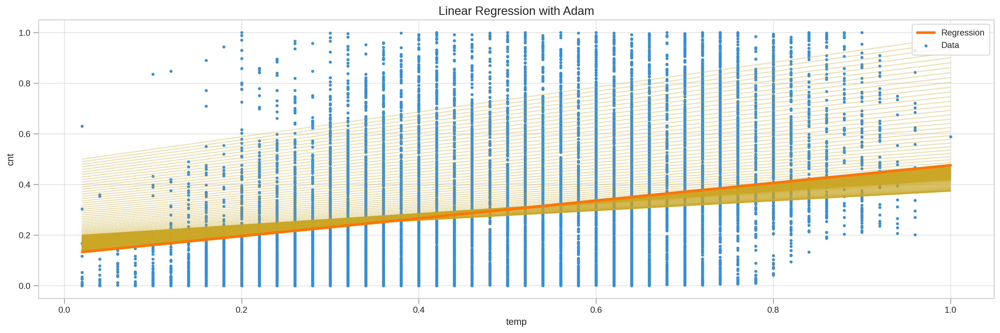

CPU times: user 5.1 s, sys: 121 ms, total: 5.22 s
Wall time: 5.24 s


In [218]:
%%time
y_pred = m*x + b
print("MSE:",mean_squared_error(y, y_pred))
plot_regression(x, y, y_pred, log=log, title="Linear Regression with Adam")

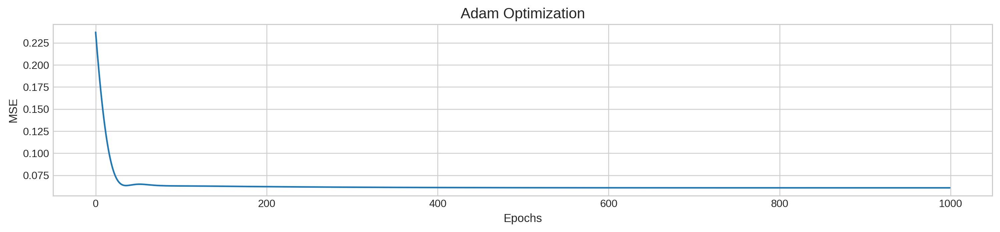

CPU times: user 398 ms, sys: 738 µs, total: 399 ms
Wall time: 402 ms


In [219]:
%%time
plt.figure(figsize=(16,3))
plt.rcParams['figure.dpi'] = 227
plt.plot(range(len(mse)), mse)
plt.title('Adam Optimization', fontSize=14)
plt.xlabel('Epochs', fontSize=11)
plt.ylabel('MSE', fontSize=11)
plt.show()

#Covergence of Adam

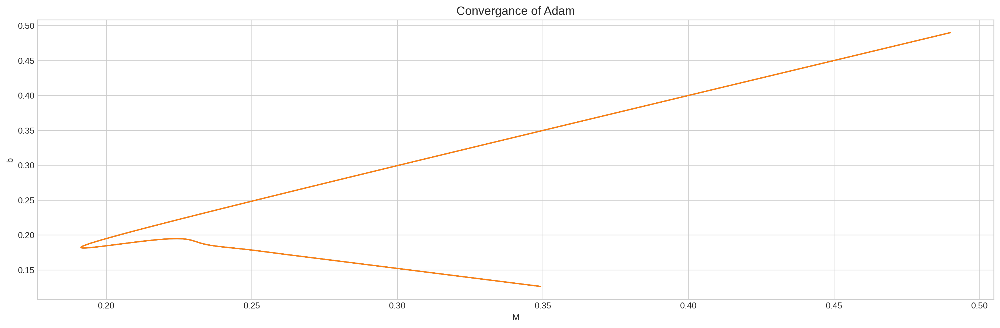

CPU times: user 797 ms, sys: 1.46 ms, total: 798 ms
Wall time: 807 ms


In [220]:
%%time
x_val = [l[0] for l in log]
y_val = [l[1] for l in log]

plt.figure(figsize=(20,6))
plt.rcParams['figure.dpi'] = 227

plt.title('Convergance of Adam', fontSize=14)
plt.xlabel('M')
plt.ylabel('b')

plt.plot(x_val,y_val)
plt.plot(x_val,y_val)

plt.show()

In [235]:
def PID_Otimizer(X, y, lr=0.05, epoch=10, Kd=0.9):

  mome_para = 0.9 # momentum factor
  #Kd = 0.25*lr + 0.5 + (1 + (16/5)* (3.14)**2) / lr #Calculating the hyperparameter Kd

  m, b = 0.5, 0.5 # parameters
  log, mse = [], [] # lists to store learning process
  N = len(X) # number of samples

  vm, dt_m, vb, dt_b = 0,0,0,0 


  prev_update_b = 0
  prev_update_m = 0
  prev_update_dt_m = 0
  prev_update_dt_b = 0
    
  for _ in range(epoch):
    f = y - (m*X + b)

    # Updating m and b
    vm = mome_para*prev_update_m + lr * (-2 * (X*f).sum() / N)
    dt_m = mome_para*prev_update_dt_m + (1 - mome_para) * (vm - prev_update_m)

    vb = mome_para*prev_update_b + lr * (-2 * f.sum() / N)
    dt_b = mome_para*prev_update_dt_b + (1 - mome_para)* (vb - prev_update_b)

    m = m - vm - Kd*dt_m
    b = b - vb - Kd*dt_b

    prev_update_m = vm
    prev_update_dt_m = dt_m

    prev_update_b = vb
    prev_update_dt_b = dt_b
        
    log.append((m, b))
    mse.append(mean_squared_error(y, (m*X + b)))  

  return m, b, log, mse
 

In [244]:
m, b, log, mse = PID_Otimizer(x, y, 0.01, 1000, 5)

MSE: 0.06079672215804235


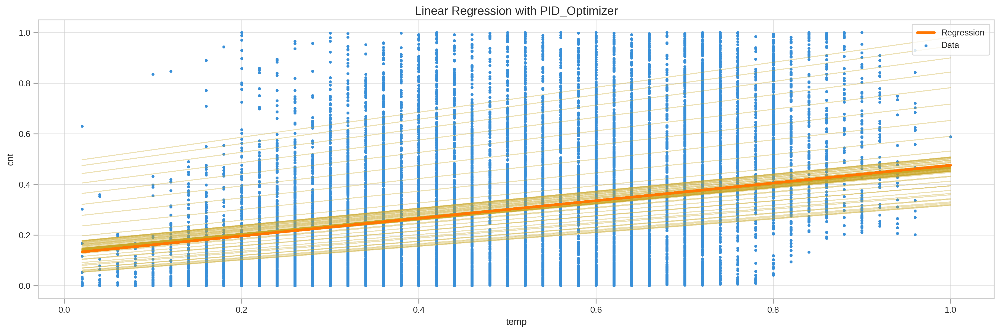

CPU times: user 5.12 s, sys: 165 ms, total: 5.29 s
Wall time: 5.3 s


In [245]:
%%time 
y_pred = m*x + b
print("MSE:",mean_squared_error(y, y_pred))
plot_regression(x, y, y_pred, log=log, title="Linear Regression with PID_Optimizer")


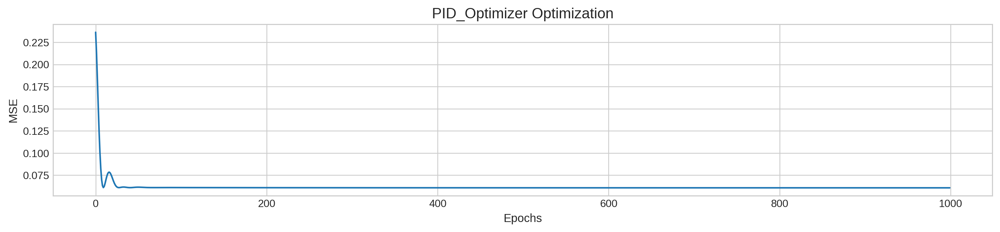

CPU times: user 417 ms, sys: 4.81 ms, total: 422 ms
Wall time: 422 ms


In [246]:
%%time
plt.figure(figsize=(16,3))
plt.rcParams['figure.dpi'] = 227
plt.plot(range(len(mse)), mse)
plt.title('PID_Optimizer Optimization', fontSize=14)
plt.xlabel('Epochs', fontSize=11)
plt.ylabel('MSE', fontSize=11)
plt.show()

#Convergence of PID Optimizer

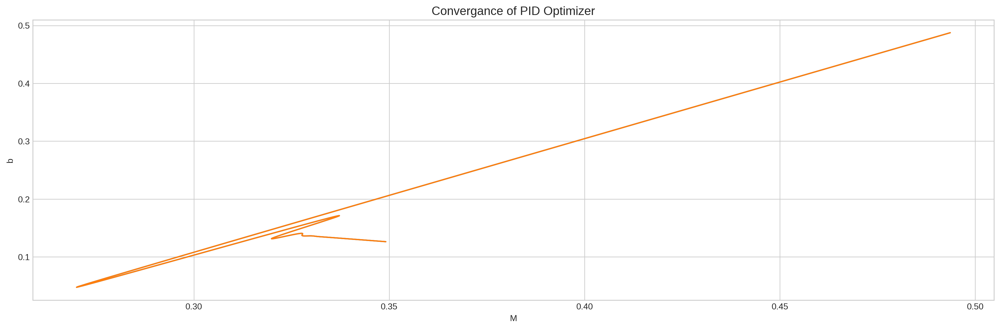

CPU times: user 883 ms, sys: 50.2 ms, total: 933 ms
Wall time: 935 ms


In [247]:
%%time
x_val = [l[0] for l in log]
y_val = [l[1] for l in log]

plt.figure(figsize=(20,6))
plt.rcParams['figure.dpi'] = 227

plt.title('Convergance of PID Optimizer', fontSize=14)
plt.xlabel('M')
plt.ylabel('b')

plt.plot(x_val,y_val)
plt.plot(x_val,y_val)

plt.show()

#Speed Test Of all the optimizers

In [226]:
X1=x
X1 = np.concatenate((X1,X1,X1,X1,X1,X1,X1,X1,X1,X1,X1,X1,X1,X1,X1,X1,X1))
y1 = np.concatenate((y,y,y,y,y,y,y,y,y,y,y,y,y,y,y,y,y))

In [227]:
%timeit UnivariateLinearRegression()

The slowest run took 19.09 times longer than the fastest. This could mean that an intermediate result is being cached.
10000000 loops, best of 3: 83.3 ns per loop


In [228]:
%timeit gradient_descent(X1, y1, lr=0.01, epoch=1000)


1 loop, best of 3: 2.33 s per loop


In [233]:
%timeit SGD(X1, y1, lr=0.01, epoch=1000, batch_size=1)

1 loop, best of 3: 1.37 s per loop


In [232]:
%timeit mini_batch_SGD(x, y, lr=0.01, epoch=1000, batch_size=1)

1 loop, best of 3: 2.78 s per loop
